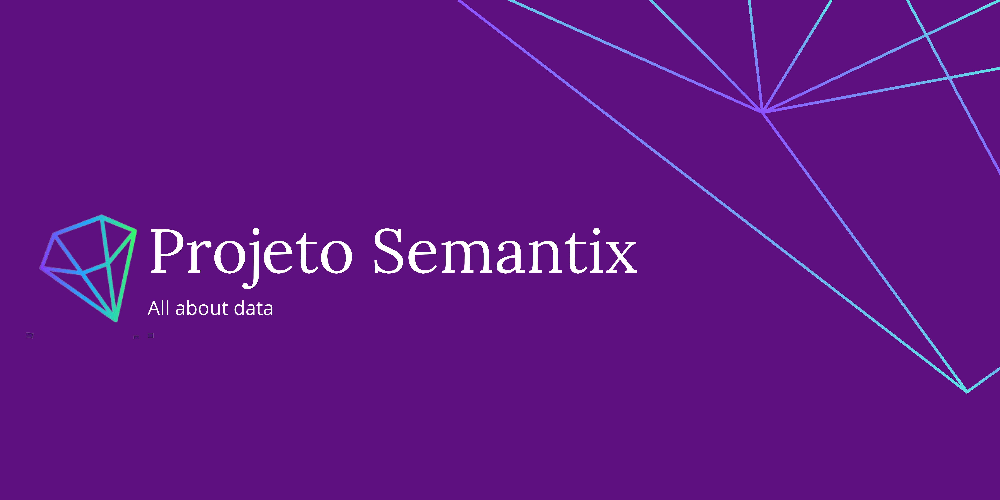

# Descrição do projeto

- O presente projeto foi concebido por meio de uma colaboração entre as organizações Semantix e EBAC, visando a elaboração e implementação de um projeto de Ciência de Dados. Essa iniciativa se baseia no conhecimento adquirido ao longo do curso de formação em Ciência de Dados, promovido pela EBAC, e representa uma parceria estratégica entre ambas as empresas.
- O objetivo do projeto abaixo consiste em desenvolver um modelo de machine learning que apresente um alto desempenho para a previsão da produção de energia em uma usina solar. 


<div class="anchor" id='home'> 
    <h1 >Sumário</h1>
    <ul>
        <li><a href="#0">Bibliotecas</a></li>
        <li><a href="#1">Avaliação da Produção de energia</a></li>
            <ul>
                <li><a href="#1.1">Análise Sobre a Avaliação</a></li>
            </ul>
        <li><a href="#2">Avaliando o Comportamento dos Atributos</a></li>
            <ul>
                <li><a href="#2.1">Análise do Relatório</a></li>
            </ul>
        <li><a href="#3">Modelo Baseline</a></li>
            <ul>
                <li><a href="#3.1">Resultados do Baseline</a></li>
            </ul>
        <li><a href="#4">Aplicando Feature Engineering</a></li>
            <ul>
                <li><a href="#4.1">Resultados do Feature Engineering</a></li>
            </ul>
        <li><a href="#5">Modelo na Prática</a></li>
        <li><a href="#6">Explorando modelos mais complexos de previsão</a></li>   
    </ul>
</div>

<div id = "0">
    
# Bibliotecas


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport



from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
import statsmodels.formula.api as smf
import xgboost as xgb



In [2]:
def importar():
    # Importar os dados
    data = pd.read_csv("./Dados/ds_solar_3.csv")
    # Tratar as colunas
    data.columns = data.columns.str.lower().str.replace(' ','_') 
    # Decompor os dados temporais
    data['data'] = pd.to_datetime(data[['year', 'month']].assign(DAY=1)).dt.date
    
    # Tratar o nome das colunas
    n_col = []        
    for i in data:
        n_col.append(i.replace('(','').replace(')',''))

    data.columns=n_col
        
    return data

In [3]:
# Carregar a base de dados
df = importar()
df.head()

,day_of_year,year,month,day,first_hour_of_period,is_daylight,distance_to_solar_noon,average_temperature_day,average_wind_direction_day,average_wind_speed_day,sky_cover,visibility,relative_humidity,average_wind_speed_period,average_barometric_pressure_period,power_generated,data
0,245,2008,9,1,1,False,0.859897,69,28,7.5,0,10.0,75,8.0,29.82,0,2008-09-01
1,245,2008,9,1,4,False,0.628535,69,28,7.5,0,10.0,77,5.0,29.85,0,2008-09-01
2,245,2008,9,1,7,True,0.397172,69,28,7.5,0,10.0,70,0.0,29.89,5418,2008-09-01
3,245,2008,9,1,10,True,0.165810,69,28,7.5,0,10.0,33,0.0,29.91,25477,2008-09-01
4,245,2008,9,1,13,True,0.065553,69,28,7.5,0,10.0,21,3.0,29.89,30069,2008-09-01


<div id = "1">

# Avaliação da Produção de energia

In [4]:
# Comportamento da variável resposta
df['power_generated'].describe()

count     2920.000000
mean      6979.846233
std      10312.336413
min          0.000000
25%          0.000000
50%        404.000000
75%      12723.500000
max      36580.000000
Name: power_generated, dtype: float64

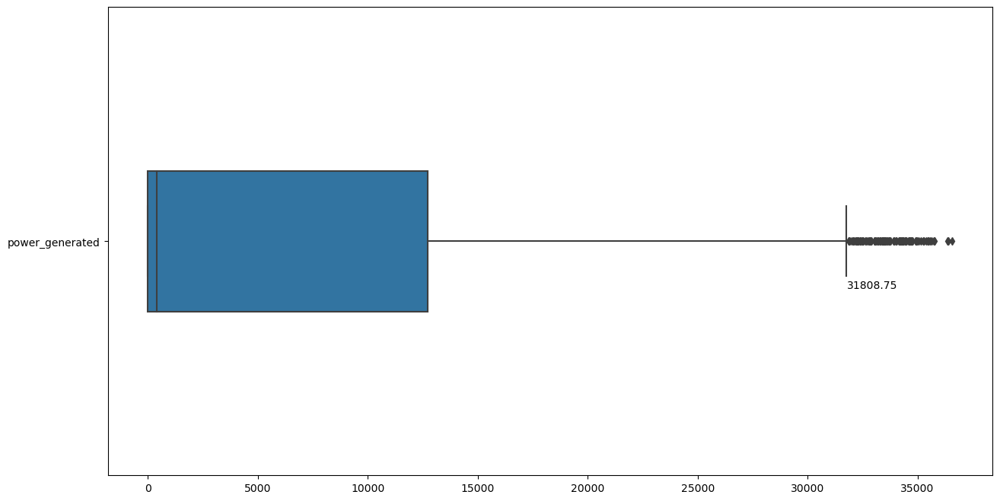

In [5]:
# Plot gráfico para avaliar se há outliers
plt.figure(figsize=(15,8))
figura = sns.boxplot(df[['power_generated']], orient='h', width=0.3)
QLT = df['power_generated'].quantile([0.25, 0.75])
dif = QLT[0.75] - QLT[0.25]
LS = QLT[0.75] + (dif*1.5)
plt.annotate(LS, xy=(LS,0.1));

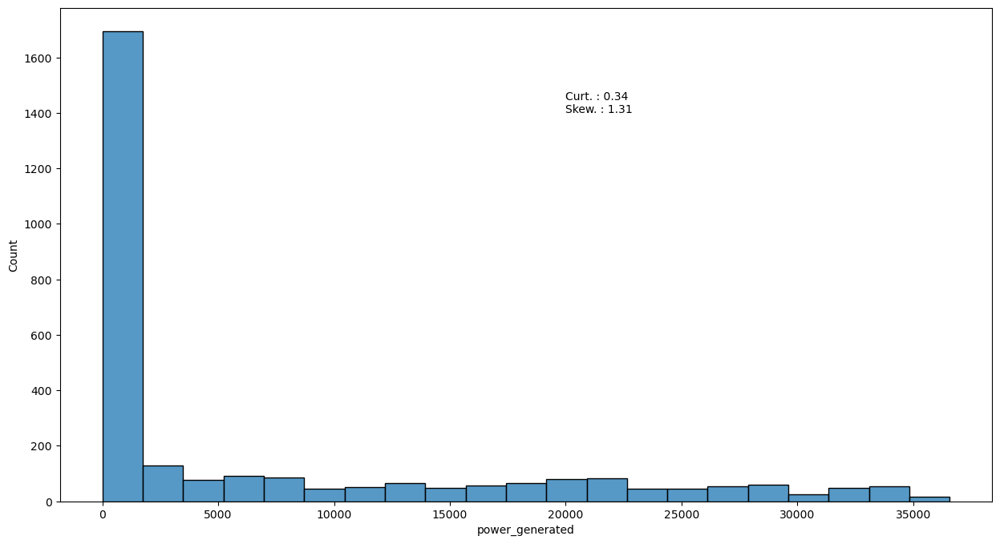

In [6]:
# Avaliar a distribuição da produção de energia.
plt.figure(figsize=(15,8))
figura = sns.histplot(df['power_generated'])
plt.annotate(f"Curt. : {round(df['power_generated'].kurt(),2)}\nSkew. : {round(df['power_generated'].skew(),2)}", xy=(20000,1400));

<div id = "1.1">

### Conclusões sobre a produção de energia.

- O primeiro gráfico, chamado de boxplot, apresenta 2 informações relevantes sobre a produção de energia: **50%** dos dados estão muito próximos de zero e que **há** presença de *outliers*, todo valor acima do valor de **31.808,75**.
- O segundo gráfico é um histograma, que nos permite avaliar o tipo de distribuição dos dados, demonstrando-se ser algo parecido com gamma.
- Essas conclusões podem ser úteis para os tratamentos dos dados mais adiante. 


<div id = "2">


# Avaliando o Comportamento dos Atributos

- A próxima etapa antes do desenvolvimento do modelo de machine learning é entender como cada variável se comporta, se há necessidade de tratamento dos dados e buscar por possíveis insights com base nas iterações dos dados. Para essa avaliação será utilizado a biblioteca ydata_profiling, ela retorna um relatório do comportamento de cada variável, assim como outras informações como iterações, vazios e etc.

In [7]:
ProfileReport(df.iloc[:,:-1])

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<div id = "2.1">


### Análise do Relatório

- Analisando o relatório acima, vemos que quase 50% dos dados são compostos por zeros, na variável resposta, ou seja, quase 50% do tempo a geração de energia é nula. 
- Diversas variáveis podem apresentar algum tipo de correlação, segundo a correlação de Pearson.
- Somente uma variável apresenta dados faltantes.
- Não há duplicadas.
- Diversas variáveis numéricas apresentam uma distribuição não normal.


<div id = "3">

## Modelo Baseline
- O "BASELINE MODEL", também chamado de modelo âncora / Referência, é um modelo utilizado como ponto de partida, sendo um modelo mais simples e que com base nele pode-se buscar um resultado melhor, além de também permitir verificar a viabilidade do projeto, ter um entendimento maior do problema e facilitar a comunicação com as partes interessadas.
- O baseline escolhido será um modelo de regressão linear da biblioteca statsmodels com o tratamento de dados sendo o mais simples possível, somente transformando os dados para serem adequados para o modelo rodar.

In [8]:
class ML_ancora:
    def __init__(self):
        self.df1 = df.copy()  
    
    def ancora(self):
        dados = self.df1.copy()
        n_col = []
        for i in dados:
            n_col.append(i.replace('(','').replace(')',''))
            
        dados.columns=n_col
        
        tf = dados.select_dtypes(exclude=np.number).columns
        for i in tf:
            dados[i] = LabelEncoder().fit_transform(dados[i])
        dados = pd.get_dummies(dados, columns = dados.nunique().sort_values()[dados.nunique()<18].index.tolist(), drop_first=True)

        tf = dados.select_dtypes(exclude=np.number).columns
        for i in tf:
            dados[i] = LabelEncoder().fit_transform(dados[i])
         
        n_col = []
        for i in dados:
            n_col.append(i.replace('.','_'))
            
        dados.columns=n_col
        colunas = dados.columns.tolist()
        colunas.remove('power_generated')
        
        
        
        col = "power_generated ~"
        c=0
        for i in colunas:
            if c == 0:
                col = f"{col}{i}"
            else:
                col = f"{col} + {i}"
            c+=1
    
        reg = smf.ols(col, data=dados).fit()
        return reg.summary()
    
    def clean_ancora(self):
        
        ancora = self.ancora()
        p = ancora.tables[1]
        p = pd.DataFrame(p, columns=['Atributos','coef','std','t','P>|t|','[0.025','0.975]']).drop(0,axis=0)
        for i in p:
            p[i] = p[i].astype(str).astype(str)
        p.set_index('Atributos',inplace=True)
        for i in p:
            p[i] = p[i].astype(str).astype(float)
            
        remover = p.loc[p['P>|t|'] > 0.05].index
        
        dados = self.df1.copy()
        n_col = []
        for i in dados:
            n_col.append(i.replace('(','').replace(')',''))
            
        dados.columns=n_col
        
        tf = dados.select_dtypes(exclude=np.number).columns
        for i in tf:
            dados[i] = LabelEncoder().fit_transform(dados[i])
        dados = pd.get_dummies(dados, columns = dados.nunique().sort_values()[dados.nunique()<18].index.tolist(), drop_first=True)
        
        tf = dados.select_dtypes(exclude=np.number).columns
        for i in tf:
            dados[i] = LabelEncoder().fit_transform(dados[i])
         
        n_col = []
        for i in dados:
            n_col.append(i.replace('.','_'))
            
        dados.columns=n_col
        
        dados = dados.drop(columns=remover)
        
        colunas = dados.columns.tolist()
        colunas.remove('power_generated')
        col = "power_generated ~"
        c=0
        for i in colunas:
            if c == 0:
                col = f"{col}{i}"
            else:
                col = f"{col} + {i}"
            c+=1
    
        reg = smf.ols(col, data=dados).fit()
        return reg.summary()
    
    def show(self, p):
        p = p.tables[1]
        p = pd.DataFrame(p, columns=['Atributos','coef','std','t','P>|t|','[0.025','0.975]']).drop(0,axis=0)
        for i in p:
            p[i] = p[i].astype(str).astype(str)
        p.set_index('Atributos',inplace=True)
        for i in p:
            p[i] = p[i].astype(str).astype(float)

        return p.sort_values(by='P>|t|').style.highlight_between(left=0, right=0.1,subset='P>|t|')

In [9]:
ancora = ML_ancora().ancora()

In [10]:

display(ancora.tables[0])
display(ancora.tables[2])


Dep. Variable:,power_generated,R-squared:,0.837
Model:,OLS,Adj. R-squared:,0.835
Method:,Least Squares,F-statistic:,314.6
Date:,"Wed, 10 Jan 2024",Prob (F-statistic):,0.00
Time:,13:52:01,Log-Likelihood:,-28465.
No. Observations:,2919,AIC:,5.703e+04
Df Residuals:,2871,BIC:,5.731e+04
Df Model:,47,,
Covariance Type:,nonrobust,,


Omnibus:,759.276,Durbin-Watson:,1.053
Prob(Omnibus):,0.000,Jarque-Bera (JB):,3126.574
Skew:,-1.214,Prob(JB):,0.00
Kurtosis:,7.451,Cond. No.,1.10e+16


In [11]:
ML_ancora().show(ancora)

,coef,std,t,P>|t|,[0.025,0.975]
Atributos,,,,,,
Intercept,-43090.000000,9671.273000,-4.456000,0.000000,-62100.000000,-24100.000000
first_hour_of_period_16,21620.000000,855.825000,25.261000,0.000000,19900.000000,23300.000000
first_hour_of_period_19,6093.295100,565.095000,10.783000,0.000000,4985.263000,7201.328000
month_10,-3289.494600,573.155000,-5.739000,0.000000,-4413.331000,-2165.658000
data_1,-3289.494600,573.155000,-5.739000,0.000000,-4413.331000,-2165.658000
data_2,-833.807200,212.911000,-3.916000,0.000000,-1251.281000,-416.334000
data_4,-30780.000000,6129.805000,-5.021000,0.000000,-42800.000000,-18800.000000
data_5,-11120.000000,2295.987000,-4.842000,0.000000,-15600.000000,-6615.589000
data_6,-7108.818800,1679.595000,-4.232000,0.000000,-10400.000000,-3815.484000


<div id=3>

### Resultados do modelo âncora.
- Usando a métrica de avalição R2 para definir o poder preditivo do modelo treinado, temos que o resultado inicial apresentou em torno de 83% de representatividade.
- O interessante do uso dessa biblioteca do statsmodels é que ela permite fazer uma avaliação estatística da influência de cada atributo para o modelo previsor. Foi considerado, no modelo acima, os valores de P value abaixo de 0.05 com significativos, marcando-os de amarelo para dar destaque e facilitar a leitura e localização. 
- Entre os dados categóricos, a variável que supreendeu pela falta de significância foi a visibilidade, tendo somente uma de suas categorias considerada significante. Agora dos dados numéricos, vemos que a temperatura média e a velocidade média do vendo, ambos durante o dia, apresentaram uma não significância para a previsão do modelo.


In [12]:
ancora = ML_ancora().clean_ancora()

In [13]:

display(ancora.tables[0])
display(ancora.tables[2])


Dep. Variable:,power_generated,R-squared:,0.836
Model:,OLS,Adj. R-squared:,0.834
Method:,Least Squares,F-statistic:,525.4
Date:,"Wed, 10 Jan 2024",Prob (F-statistic):,0.00
Time:,13:52:01,Log-Likelihood:,-28480.
No. Observations:,2919,AIC:,5.702e+04
Df Residuals:,2890,BIC:,5.719e+04
Df Model:,28,,
Covariance Type:,nonrobust,,


Omnibus:,754.525,Durbin-Watson:,1.034
Prob(Omnibus):,0.000,Jarque-Bera (JB):,3031.715
Skew:,-1.214,Prob(JB):,0.00
Kurtosis:,7.362,Cond. No.,1.11e+16


In [14]:
ML_ancora().show(ancora)

,coef,std,t,P>|t|,[0.025,0.975]
Atributos,,,,,,
Intercept,-48280.000000,9327.392000,-5.177000,0.000000,-66600.000000,-30000.000000
data_4,-32290.000000,4656.640000,-6.933000,0.000000,-41400.000000,-23200.000000
data_5,-11830.000000,1691.353000,-6.995000,0.000000,-15100.000000,-8514.505000
data_6,-7791.386400,1190.613000,-6.544000,0.000000,-10100.000000,-5456.850000
data_7,-3756.849100,613.413000,-6.124000,0.000000,-4959.621000,-2554.077000
data_9,3866.141900,641.067000,6.031000,0.000000,2609.148000,5123.136000
data_10,6629.249300,1163.223000,5.699000,0.000000,4348.418000,8910.080000
data_11,9118.901300,1739.701000,5.242000,0.000000,5707.720000,12500.000000
month_2,-11830.000000,1691.353000,-6.995000,0.000000,-15100.000000,-8514.505000


### Resultados da limpeza.
- Como esperado, muito pouco foi perdido com o R2 e temos uma base de dados menor.
- Agora com a definição do que é a âncora, podemos buscar aperfeiçoar o resultado com formas de tratamento dos dados, assim como utilizar modelos que capturem padrões mais complexos.

<div id = "4">

## Aplicando Feature Engineering
- Uma das principais maneiras de otimizar um modelo de machine learning é trabalhando em cima das informações já disponíveis, esse trabalho se dá através da criação, transformação e decomposição desses dados, visando aperfeiçoar o modelo de previsão de machine learning. 
- Após a âncora já estabelecida, o próximo passo pode ser feito que é arrumar os dados visando melhorar as métricas de avaliação. Abaixo algumas das funções elaboradas para a melhora do modelo é transformar dados numéricos passando o logarítmo, decompondo dados numéricos em categorias e também realizar a criação de novas features com base em relação entre outras.

In [15]:
class ML_:
    def __init__(self,dado):
        self.dt = dado.copy()
        
    def c1(self):
        dados = self.dt

        tf = dados.select_dtypes(exclude=np.number).columns
        for i in tf:
            dados[i] = LabelEncoder().fit_transform(dados[i])
         
        n_col = []
        for i in dados:
            n_col.append(i.replace('.','_'))
            
        dados.columns=n_col
        colunas = dados.columns.tolist()
        colunas.remove('power_generated')
        col = "power_generated ~"
        c=0
        for i in colunas:
            if c == 0:
                col = f"{col}{i}"
            else:
                col = f"{col} + {i}"
            c+=1
    
        reg = smf.ols(col, data=dados).fit()
        return reg.summary()
    
    def show(self, p):
        p = p.tables[1]
        p = pd.DataFrame(p, columns=['Atributos','coef','std','t','P>|t|','[0.025','0.975]']).drop(0,axis=0)
        for i in p:
            p[i] = p[i].astype(str).astype(str)
        p.set_index('Atributos',inplace=True)
        for i in p:
            p[i] = p[i].astype(str).astype(float)

        return p.sort_values(by='P>|t|').style.highlight_between(left=0, right=0.1,subset='P>|t|')     
    

In [16]:
def transform(x):
    dt = x.copy()
    # Transformação. (log e quadrado)
    
    #dt['power_generated'] = np.log(dt['power_generated']+1)
    dt['distance_to_solar_noon_2'] = dt['distance_to_solar_noon']**2
    dt['average_wind_direction_day'] = (dt['average_wind_direction_day'])**2
    dt['average_wind_speed_period'] =  dt['average_wind_speed_period']**2


    # categorizar valores numéricos.  
    dt['average_wind_speed_day'] = pd.qcut(dt['average_wind_speed_day'], q=8).astype(str)
    dt['relative_humidity_cat'] = pd.qcut(dt['relative_humidity'], q=7).astype(str)
    dt['distance_to_solar_noon_cat'] = pd.qcut(dt['distance_to_solar_noon'], q=7).astype(str)
    dt['average_wind_direction_day_cat'] = pd.qcut(dt['average_wind_direction_day'], q=7).astype(str)
    dt['average_temperature_day_cat'] = pd.qcut(dt['average_temperature_day'], q=3).astype(str)

    # Criar features.
    dt['creation'] = dt['distance_to_solar_noon'] * dt['relative_humidity']
    dt['creation_cat'] = pd.qcut(dt['creation'], q=5).astype(str)

    tf = dt.select_dtypes(exclude=np.number).columns
        
    for i in tf:
        dt[i] = LabelEncoder().fit_transform(dt[i])
        
    dt = pd.get_dummies(dt, columns = dt.nunique().sort_values()[dt.nunique()<18].index.tolist(), drop_first=False)
    
    return ML_(dt).c1()
 

In [17]:
dados = transform(df)

In [18]:
display(dados.tables[0])
display(dados.tables[2])


Dep. Variable:,power_generated,R-squared:,0.880
Model:,OLS,Adj. R-squared:,0.877
Method:,Least Squares,F-statistic:,264.3
Date:,"Wed, 10 Jan 2024",Prob (F-statistic):,0.00
Time:,13:52:02,Log-Likelihood:,-28018.
No. Observations:,2919,AIC:,5.620e+04
Df Residuals:,2839,BIC:,5.667e+04
Df Model:,79,,
Covariance Type:,nonrobust,,


Omnibus:,1158.167,Durbin-Watson:,1.202
Prob(Omnibus):,0.000,Jarque-Bera (JB):,10819.201
Skew:,-1.620,Prob(JB):,0.00
Kurtosis:,11.858,Cond. No.,2.79e+16


In [19]:
ML_(df).show(dados)

,coef,std,t,P>|t|,[0.025,0.975]
Atributos,,,,,,
first_hour_of_period_10,4484.089300,887.028000,5.055000,0.000000,2744.804000,6223.374000
distance_to_solar_noon_cat_0,-5167.571300,999.613000,-5.170000,0.000000,-7127.611000,-3207.531000
distance_to_solar_noon_cat_2,-3218.423800,732.579000,-4.393000,0.000000,-4654.864000,-1781.983000
relative_humidity_cat_0,3036.293000,794.403000,3.822000,0.000000,1478.628000,4593.958000
relative_humidity_cat_5,-2721.730300,695.039000,-3.916000,0.000000,-4084.562000,-1358.899000
relative_humidity_cat_6,-3157.666600,760.610000,-4.151000,0.000000,-4649.071000,-1666.262000
first_hour_of_period_1,-8234.575100,861.170000,-9.562000,0.000000,-9923.158000,-6545.992000
first_hour_of_period_4,-4351.198100,702.038000,-6.198000,0.000000,-5727.753000,-2974.643000
first_hour_of_period_13,8766.262000,914.448000,9.586000,0.000000,6973.212000,10600.000000


<div id = "4.1">

### Resultados
- O Feature Engineering aplicado nos dados realizou a criação de alguns atributos, sendo as principais técnicas aplicadas as seguintes: regressão polinomial, decomposição de atributos numéricos em categóricos e criando novos atributos baseado em interações dos mesmos.
- Utilizando a métrica R2 como base para a análise de desempenho do modelo desenvolvido, a aplicação da feature engineering conseguiu alcançar uma representativividade maior do R2, aonde saimos de 83% para 88%. Essa margem foi alcançada de forma simples e já muito signficativa.


<div id = "5">

## Análisando na prática

- O resultado obtido acima foi com base no treinamento de todo o dataset e o uso do mesmo para a previsão dos resultados. A partir desse ponto, os dados serão separados em treino e teste de forma aleatória, com o intuito de validar a porcentagem de acerto real que esse dataset pode realmente alcançar.

In [20]:
from sklearn.metrics import r2_score, mean_squared_error, make_scorer
from sklearn.model_selection import cross_val_score
import lightgbm as lgb

In [21]:
class pratica:
    def __init__(self):
        self.d = df.copy()
        
    def ML_analise(self, x1, x2, y):
       
        colunas = x1.columns.tolist()
        colunas.remove('power_generated')
        col = "power_generated ~ "
        c=0
        for i in colunas:
            if c == 0:
                col = f"{col}{i}"
            else:
                col = f"{col} + {i}"
            c+=1
    
        reg = smf.ols(col, data=x1).fit()
        prev = reg.predict(x2)
        return y, prev     
        
    def ancora(self,x):
        dg = x.copy()

        dg = pd.get_dummies(dg, columns = dg.nunique().sort_values()[dg.nunique()<18].index.tolist(), drop_first=False)

        tf = dg.select_dtypes(exclude=np.number).columns
        for i in tf:
            dg[i] = LabelEncoder().fit_transform(dg[i])

        n_col = []
        for i in dg:
            n_col.append(i.replace('.','').strip().replace('-','_'))

        dg.columns=n_col

        X = dg.copy()
        y = dg.pop("power_generated")

        x1, x2, y1, y2 = train_test_split(X, y, test_size=0.15, random_state=10)
        x1['power_generated'] = y1
        y_r, y_p = pratica().ML_analise(x1, x2, y2)
        r2 = r2_score(y_r, y_p)
        rmse = np.sqrt(mean_squared_error(y_r, y_p))
        print(f"Resultado do R2 para a base de dados sem tratamento {round(r2*100,2)} %")
        print(f"Resultado do RMSE para a base de dados sem tratamento {rmse:.2f} ")
        return y_r, y_p
        
    def transform(self,x):
        dt = x.copy()
        # Transformação. (log e quadrado)

        #dt['power_generated'] = np.log(dt['power_generated']+1)
        dt['distance_to_solar_noon_2'] = dt['distance_to_solar_noon']**2
        dt['average_wind_direction_day'] = (dt['average_wind_direction_day'])**2
        dt['average_wind_speed_period'] =  dt['average_wind_speed_period']**2


        # categorizar valores numéricos.
        dt['average_wind_speed_day'] = pd.qcut(dt['average_wind_speed_day'], q=8).astype(str)
        dt['relative_humidity_cat'] = pd.qcut(dt['relative_humidity'], q=7).astype(str)
        dt['distance_to_solar_noon_cat'] = pd.qcut(dt['distance_to_solar_noon'], q=7).astype(str)
        dt['average_wind_direction_day_cat'] = pd.qcut(dt['average_wind_direction_day'], q=7).astype(str)
        dt['average_temperature_day_cat'] = pd.qcut(dt['average_temperature_day'], q=3).astype(str)

        # Criar features.
        dt['creation'] = dt['distance_to_solar_noon'] * dt['relative_humidity']
        dt['creation_cat'] = pd.qcut(dt['creation'], q=5).astype(str)

        tf = dt.select_dtypes(exclude=np.number).columns
        for i in tf:
            dt[i] = LabelEncoder().fit_transform(dt[i])
            
        # Label ENcoder
        dt = pd.get_dummies(dt, columns = dt.nunique().sort_values()[dt.nunique()<18].index.tolist(), drop_first=False)
        
        tf = dt.select_dtypes(exclude=np.number).columns
        for i in tf:
            dt[i] = LabelEncoder().fit_transform(dt[i])
        
        n_col = []
        for i in dt:
            n_col.append(i.replace('.','').strip().replace('-','_'))

        dt.columns=n_col
        X = dt.copy()
        y = dt.pop("power_generated")
        x1, x2, y1, y2 = train_test_split(X, y, test_size=0.15, random_state=10)
        x1['power_generated'] = y1
        y_r, y_p  = pratica().ML_analise(x1, x2, y2)
        #y_r = np.exp(y_r) - 1
        #y_p = np.exp(y_p) - 1
        r2 = r2_score(y_r, y_p)
        print(f"Resultado do R2 para a base de dados tratada com feature engineering {round(r2*100,2)} %")
        rmse = np.sqrt(mean_squared_error(y_r, y_p))
        
        print(f"Resultado do RMSE para a base de dados tratada com feature engineering  {rmse:.2f} ")
        return y_r, y_p
    
    
    

In [22]:
yr1, yp1 = pratica().ancora(df)

Resultado do R2 para a base de dados sem tratamento 81.28 %
Resultado do RMSE para a base de dados sem tratamento 4454.20 


In [23]:
yr2, yp2 = pratica().transform(df)

Resultado do R2 para a base de dados tratada com feature engineering 87.09 %
Resultado do RMSE para a base de dados tratada com feature engineering  3699.41 


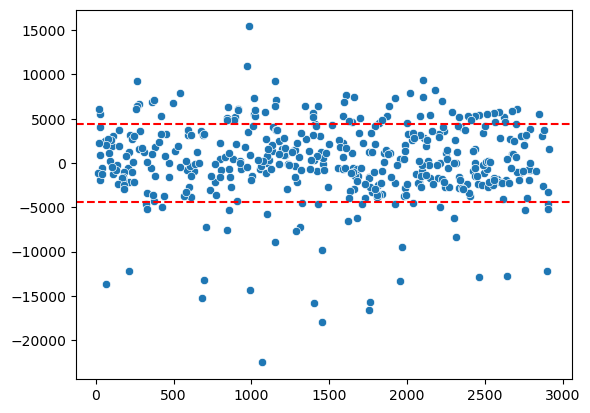

In [24]:
sns.scatterplot(yr1 - yp1)
plt.axhline(y=4454.20, color='red', linestyle='--', label='Sua Linha Horizontal')
plt.axhline(y=-4454.20, color='red', linestyle='--', label='Sua Linha Horizontal')

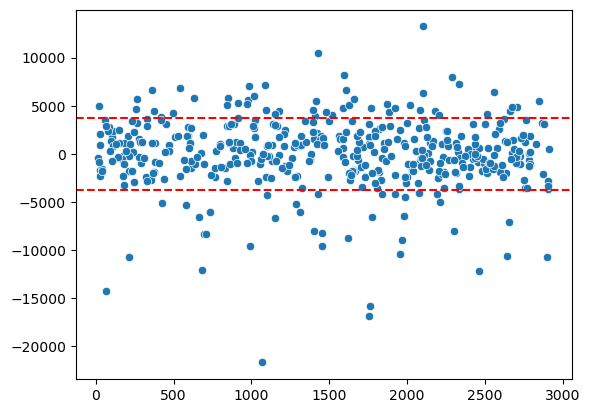

In [25]:
sns.scatterplot(yr2 - yp2)
plt.axhline(y=3699.41, color='red', linestyle='--', label='Sua Linha Horizontal')
plt.axhline(y=-3699.41, color='red', linestyle='--', label='Sua Linha Horizontal')

<div id = "6">

# Explorando modelos mais complexos de previsão

- Apesar de muito eficiente, os modelos acima acabam sendo limitados, pois certas relações complexas entre os dados não são captadas pelo algoritmo. Em busca de contornar esse problema, abaixo será utilizado um modelo mais complexo e amplamente difundido como um dos melhores de machine learning, que é o Extreme Gradient Boosting, também chamado de XGBoost. Essa técnica é baseada em árvore de decisão, caracterizando-se por ter alta velocidade no processamento, distribuindo o treinamento em diversas cores do processador, além de ter certas especificações matemáticas que buscam ótimas soluções.


In [28]:
class ML:
    def __init__(self, dado):
        self.resultado = self.modelo_xgb(dado)
        
    def resultado(self, x1, x2, y1, y2):
        modelo = xgb.XGBRegressor(
            n_estimators = 6000,
            learning_rate = 0.001,
            max_depth = 50,
            #max_leaves = 2
        )
        modelo.fit(x1, y1)
        
        prev = modelo.predict(x2)
        
        saida = pd.DataFrame()
        saida['real'] = np.exp(y2) -1
        saida['forecast'] = np.exp(prev)-1

        r2 = r2_score(saida['real'], saida['forecast'])
        rmse = np.sqrt(mean_squared_error(saida['real'], saida['forecast']))
        print(f"Resultado do R2 para o modelo XGBoost: {r2*100:.2f} %")
        print(f"Resultado do RMSE para o modelo XGBoost: {rmse:.2f} ")
        return saida

    def modelo_xgb(self, x):
        dt = x.copy()
        # Transformação. (log e quadrado)

        dt['power_generated'] = np.log(dt['power_generated']+1)
        dt['distance_to_solar_noon'] = dt['distance_to_solar_noon']**2
        dt['average_wind_direction_day'] = dt['average_wind_direction_day']**2
        dt['average_wind_speed_period'] =  dt['average_wind_speed_period']**2


        # categorizar valores numéricos.
        dt['average_wind_speed_day'] = pd.qcut(dt['average_wind_speed_day'], q=8).astype(str)
        dt['relative_humidity_cat'] = pd.qcut(dt['relative_humidity'], q=7).astype(str)
        dt['distance_to_solar_noon_cat'] = pd.qcut(dt['distance_to_solar_noon'], q=7).astype(str)
        dt['average_wind_direction_day_cat'] = pd.qcut(dt['average_wind_direction_day'], q=7).astype(str)
        dt['average_temperature_day_cat'] = pd.qcut(dt['average_temperature_day'], q=3).astype(str)

        # Criar features.
        dt['creation'] = dt['distance_to_solar_noon'] * dt['relative_humidity']
        dt['creation_cat'] = pd.qcut(dt['creation'], q=5).astype(str)

        tf = dt.select_dtypes(exclude=np.number).columns
        for i in tf:
            dt[i] = LabelEncoder().fit_transform(dt[i])


        tf = dt.select_dtypes(exclude=np.number).columns
        for i in tf:
            dt[i] = LabelEncoder().fit_transform(dt[i])

        n_col = []
        for i in dt:
            n_col.append(i.replace('.','').strip().replace('-','_'))

        dt.columns=n_col
        X = dt.copy()
        y = dt.pop("power_generated")
        x1, x2, y1, y2 = train_test_split(X, y, test_size=0.15, random_state=10)

        return self.resultado(x1, x2, y1, y2 )

In [29]:
res = ML(df).resultado

Resultado do R2 para o modelo XGBoost: 99.96 %
Resultado do RMSE para o modelo XGBoost: 197.41 


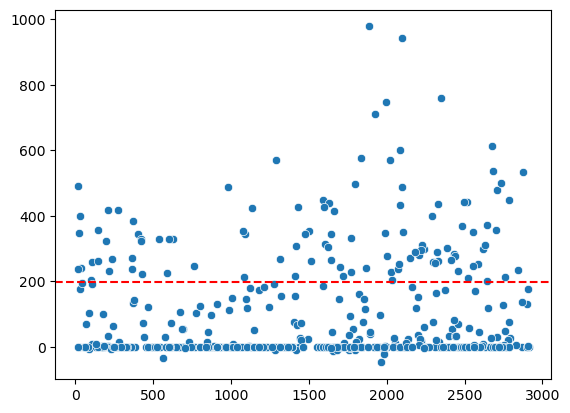

In [30]:
sns.scatterplot(res['real'] - res['forecast'])
plt.axhline(y=197.41, color='red', linestyle='--', label='Sua Linha Horizontal')